# get measured dot position in PFI mm coordinates (only one case)

In [1]:
%matplotlib notebook

import os
import sys
import pandas as pd
import sep
import cv2
from copy import deepcopy

import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
import math

In [2]:
sys.path.append('/work/PFS/repo/pfs_utils/python')
from pfs.utils.coordinates.transform import ASRD71MTransform, PfiTransform

In [3]:
im_data_dir = '/work/PFS/pfi/data/erun03/2021-09-26'
repo_dir = '/work/PFS/repo/pfs_instdata'
ff_data_dir = '/work/PFS/pfi/data/ffdata'

## read data

### raw dot image data (on MCS)

In [4]:
filename=os.path.join(im_data_dir, 'PFSC06884000.fits')
with fits.open(filename) as hdul:
    data_dots=hdul[1].data

<IPython.core.display.Javascript object>


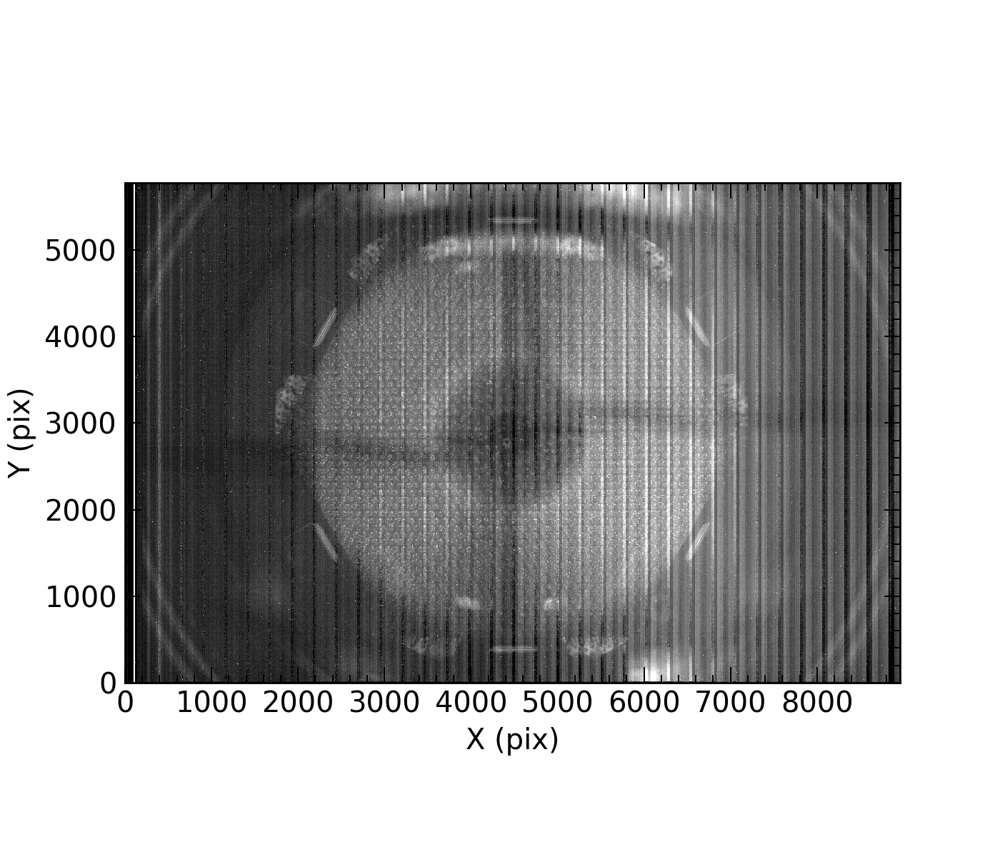

In [5]:
## check distribution
fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_dots, origin='lower', cmap='gray', vmin=38500, vmax=39500)

### raw ff image data (on MCS)

In [6]:
#filename=os.path.join(im_data_dir, 'PFSC06882100.fits')
filename=os.path.join(im_data_dir, 'PFSC06884100.fits')
with fits.open(filename) as hdul:
    data_ffs=hdul[1].data

<IPython.core.display.Javascript object>


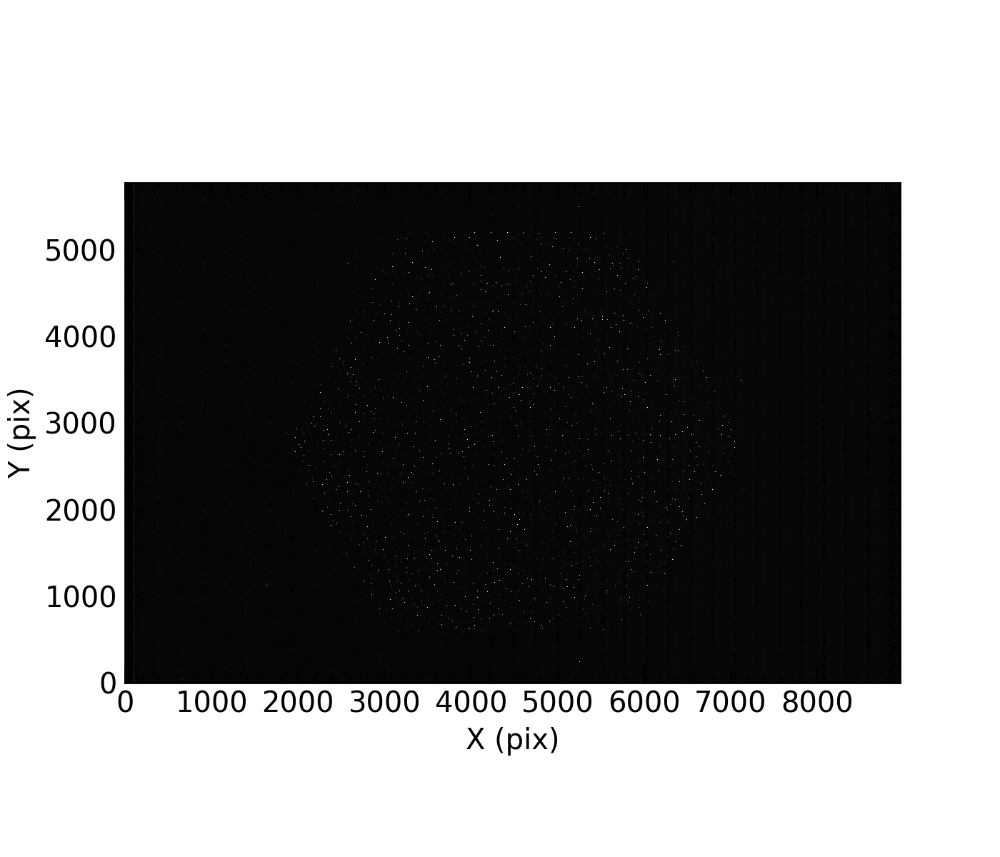

In [7]:
## check distribution
fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)

### ff positions (in PFI mm)

#### T=20 degC

In [8]:
filename = os.path.join(ff_data_dir, 'fiber_status_summary_FF_20C90DEG.txt')
ff_pfi_id, ff_pfi_x, ff_pfi_y = np.genfromtxt(filename, unpack=True, usecols=(1, 3, 4))
msk = (ff_pfi_id != 32) * (ff_pfi_id != 63)
ff_pfi_20c_id = ff_pfi_id[msk]
ff_pfi_20c_x = ff_pfi_x[msk]
ff_pfi_20c_y = ff_pfi_y[msk]

#### T=0 degC

In [9]:
filename = os.path.join(ff_data_dir, 'fiber_status_summary_FF_0C90DEG.txt')
ff_pfi_id, ff_pfi_x, ff_pfi_y = np.genfromtxt(filename, unpack=True, usecols=(1, 3, 4))
msk = (ff_pfi_id != 32) * (ff_pfi_id != 63)
ff_pfi_00c_id = ff_pfi_id[msk]
ff_pfi_00c_x = ff_pfi_x[msk]
ff_pfi_00c_y = ff_pfi_y[msk]

#### set temperature for the analysis

In [10]:
ff_pfi_id = ff_pfi_00c_id.copy()
ff_pfi_x = ff_pfi_00c_x.copy()
ff_pfi_y = ff_pfi_00c_y.copy()
#ff_pfi_id = ff_pfi_20c_id.copy()
#ff_pfi_x = ff_pfi_20c_x.copy()
#ff_pfi_y = ff_pfi_20c_y.copy()

### measured ff positions (in MCS pix)

In [11]:
#filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v68821.csv'
filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v68841.csv'
mcs_data = pd.read_csv(filename)
spots_x = mcs_data['mcs_center_x_pix'].copy()
spots_y = mcs_data['mcs_center_y_pix'].copy()
mcs_data[:3]

,mcs_frame_id,spot_id,mcs_center_x_pix,mcs_center_y_pix,mcs_second_moment_x_pix,mcs_second_moment_y_pix,mcs_second_moment_xy_pix,bgvalue,peakvalue
0,6884100,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6884100,2349.0,5246.86,5500.99,1.95930,2.29791,-0.133040,23.4354,5991.88
2,6884100,2348.0,3659.99,5486.12,1.71541,2.40514,-0.102904,23.4354,6331.67


#### initial guess of rough positions

In [12]:
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=1.0*ff_pfi_y))
fids[:3]

,fiducialId,x_mm,y_mm
0,1.0,-13.875,11.138
1,2.0,-28.542,18.376
2,3.0,-41.527,26.295


In [13]:
mpt = PfiTransform(altitude=90, insrot=0, applyDistortion=False)
mpt.updateTransform(mcs_data, fids, matchRadius=15, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

<IPython.core.display.Javascript object>


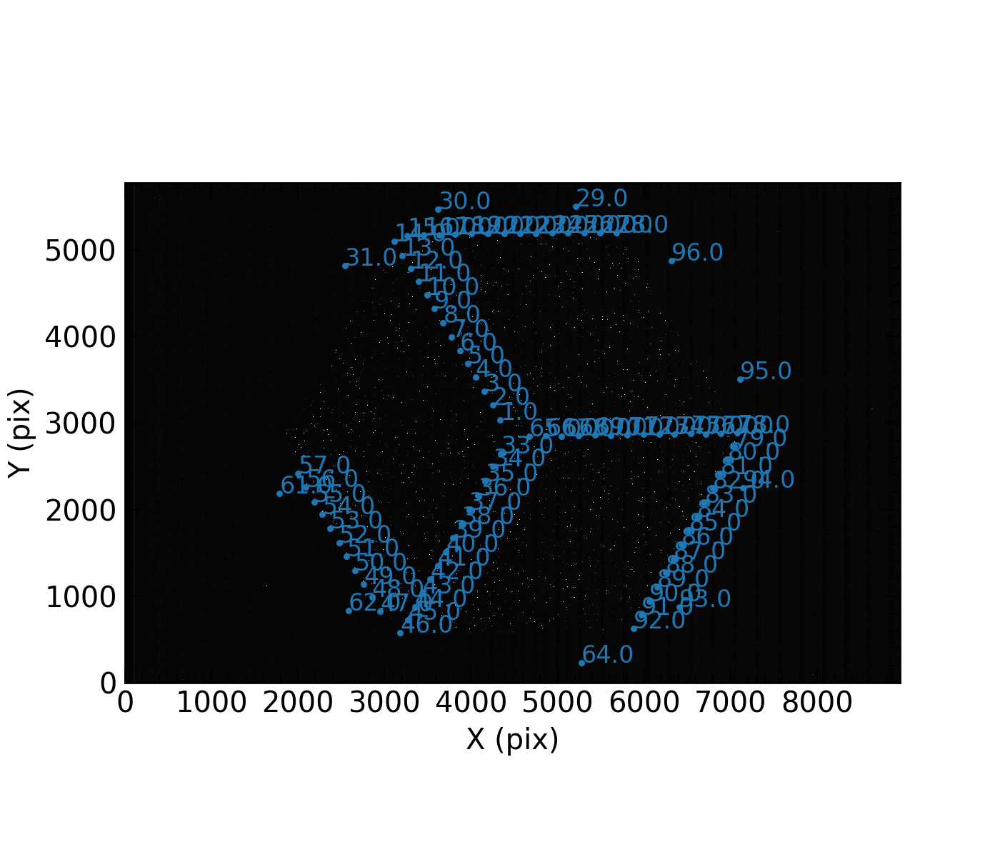

In [14]:
## check distribution
fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_init_x, ff_mcs_init_y, s=5, c='C0')
for i in range(len(ff_mcs_init_id)):
    axe.text(ff_mcs_init_x[i], ff_mcs_init_y[i], ff_mcs_init_id[i], c='C0', fontsize=12)

#### 2nd pass

In [15]:
sep = 70 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)  
mcs_data2 = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))

In [16]:
mpt = PfiTransform(altitude=90, insrot=0, applyDistortion=True)
mpt.updateTransform(mcs_data2, fids, matchRadius=1, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

In [17]:
sep = 20 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)
ff_mcs_id = np.array(ff_mcs_id, dtype='i4')            
ff_mcs_x = np.array(ff_mcs_x, dtype='f4')
ff_mcs_y = np.array(ff_mcs_y, dtype='f4')

In [18]:
df = pd.DataFrame({
    'idx': np.array(ff_mcs_id, dtype='i4'),
    'x_pixel': np.array(ff_mcs_x, dtype='f4'),
    'y_pixel': np.array(ff_mcs_y, dtype='f4')
})
df[:3]

,idx,x_pixel,y_pixel
0,1,4350.430176,3052.739990
1,2,4266.370117,3227.580078
2,3,4174.290039,3381.860107


<IPython.core.display.Javascript object>


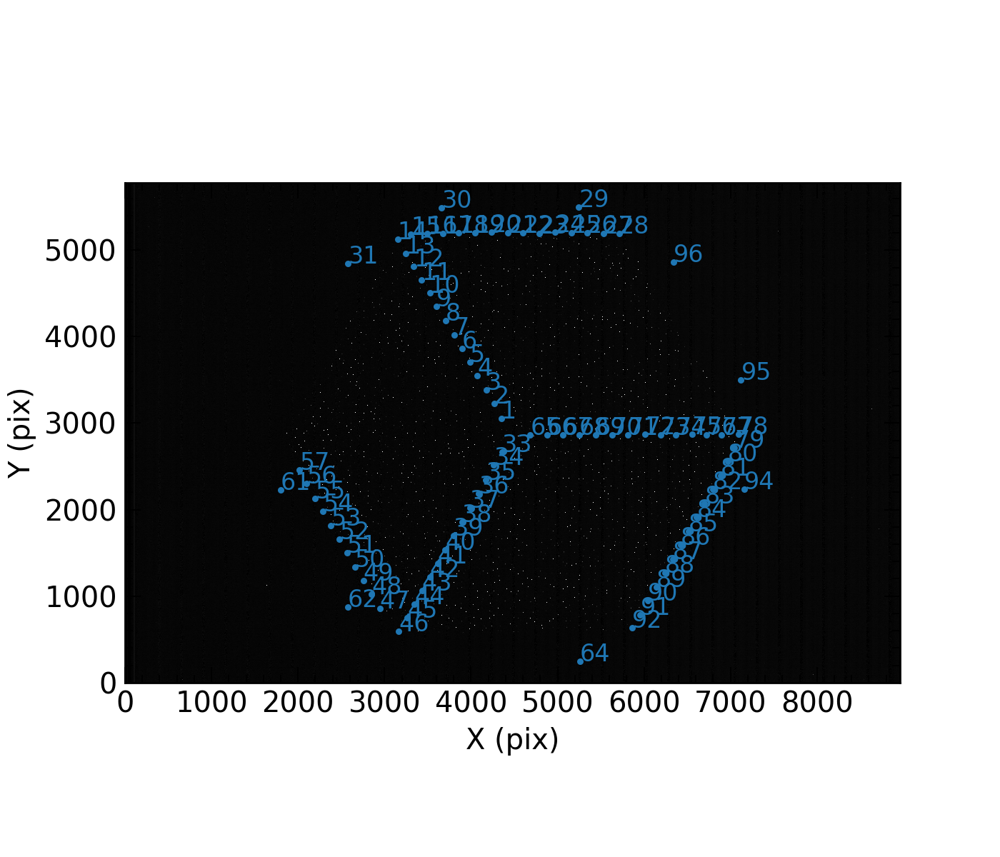

In [19]:
## check distribution
fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_x, ff_mcs_y, s=5, c='C0')
for i in range(len(ff_mcs_id)):
    axe.text(ff_mcs_x[i], ff_mcs_y[i], ff_mcs_id[i], c='C0', fontsize=12)    

#### sanity check

In [20]:
print(len(ff_mcs_init_id))
print(len(ff_mcs_id))

for i1 in ff_mcs_init_id:
    c=0
    for i2 in ff_mcs_id:
         if i1==i2:
                c+=1
    if c==0:
        print(i1)

91
90
93.0


#### writeto

In [21]:
df = pd.DataFrame({
    'id': np.array(ff_mcs_id, dtype='i4'),
    'x_pix': np.array(ff_mcs_x, dtype='f4'),
    'y_pix': np.array(ff_mcs_y, dtype='f4'),
})
df.to_csv('ffs_mcs_pix_kiyoyabe_20211108.csv', index=False)
df[:3]

,id,x_pix,y_pix
0,1,4350.430176,3052.739990
1,2,4266.370117,3227.580078
2,3,4174.290039,3381.860107


### designed dot position (in mm but the vendor's coordinate system)

In [22]:
filename = os.path.join(repo_dir, 'data/pfi/dot',
                        'dot_design_asrd_20210422.txt')
fel = pd.read_csv(filename,
                  delim_whitespace=True,
                  header=None,
                  names=['id', 'x_mm', 'y_mm', 'x', 'y', 'bb', 'cc']
                 )
dot_design_id = fel['id']
dot_design_x = fel['x_mm']
dot_design_y = fel['y_mm']
fel[:3]

,id,x_mm,y_mm,x,y,bb,cc
0,0,96.994843,0.0,5614.759176,2886.225955,5614.759277,2886.101562
1,1,103.923042,4.0,5695.685201,2932.765529,5695.393555,2932.880127
2,2,110.851250,8.0,5776.593112,2979.286068,5776.393066,2979.337891


### measured dot position (in MCS pix)

In [23]:
filename = './results/dot_measurements_subaru_20210926_el90_rot+00_v68840.csv'
df = pd.read_csv(filename)
dot_mcs_id = df['id']
dot_mcs_x = df['x_tran']
dot_mcs_y = df['y_tran']
dot_mcs_r = df['r_tran']

<IPython.core.display.Javascript object>


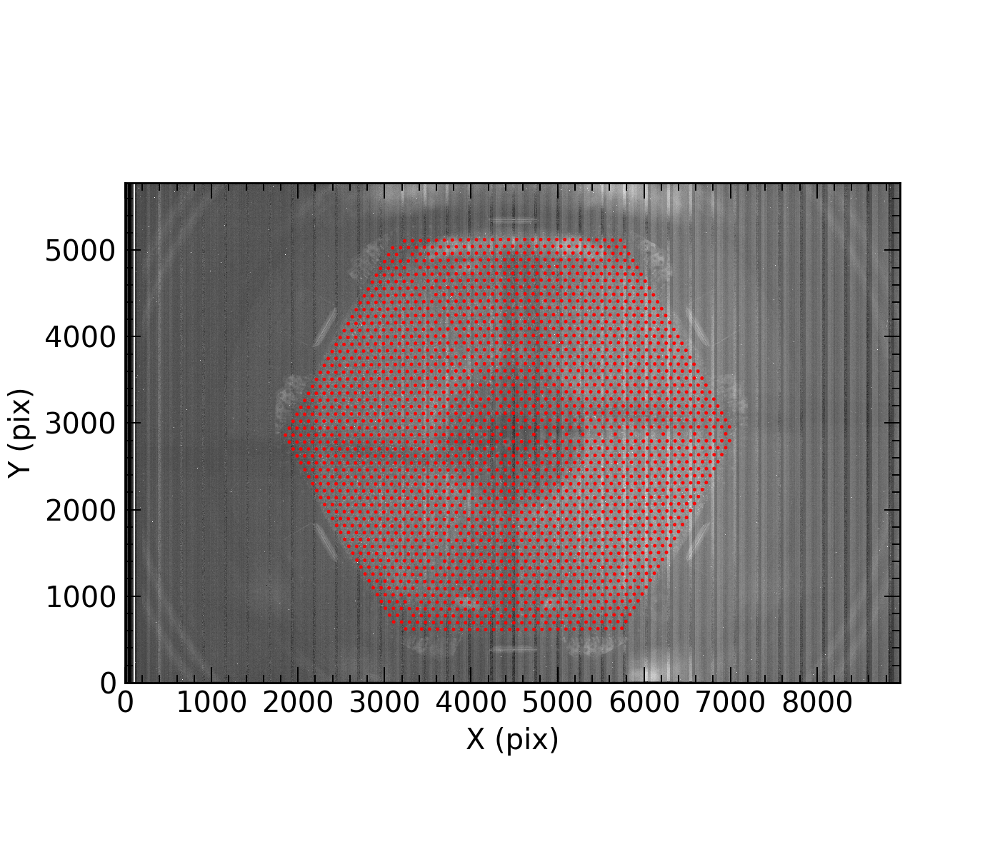

In [24]:
fig, axe = plt.subplots(figsize=(7, 6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_dots, origin='lower', cmap='gray', vmin=38000, vmax=40000)
for x,y,r in zip(dot_mcs_x, dot_mcs_y, dot_mcs_r):
    c1 = plt.Circle((x,y), r, color='red', fill=False)
    axe.add_artist(c1)

### previous dot positions (in PFI mm)

In [25]:
filename = os.path.join(repo_dir, 'data/pfi/dot', 'black_dots_mm.csv')
df = pd.read_csv(filename)
dot_pfi_old_id = df['spotId']
dot_pfi_old_x = df['x']
dot_pfi_old_y = df['y']
dot_pfi_old_r = df['r']
df[:3]

,spotId,x,y,r
0,1,-5.353405,7.447845,0.750886
1,2,-12.345163,3.536719,0.750811
2,3,-5.462555,-0.562960,0.750919


### previous ff position (in PFI mm)

In [26]:
filename = os.path.join(repo_dir, 'data/pfi', 'fiducial_positions.csv')
df = pd.read_csv(filename, comment='#')
ff_pfi_old_id = df['fiducialId']
ff_pfi_old_x = df['x_mm']
ff_pfi_old_y = df['y_mm']
df[:3]

,fiducialId,x_mm,y_mm
0,1,-13.838,11.133
1,2,-28.527,18.399
2,3,-41.500,26.353


## get conversion from MCS pix to PFI mm using PfiTransform

### calculate conversion

In [27]:
## FFs in mm
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=ff_pfi_y))  
## FFs in pix
mcs_data = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y)) 

In [28]:
mpt = PfiTransform()
mpt.updateTransform(mcs_data, fids, matchRadius=1.0, nMatchMin=0.75)

In [29]:
dot_pfi_utils_x, dot_pfi_utils_y = mpt.mcsToPfi(dot_mcs_x, dot_mcs_y)

In [30]:
x1, y1 = mpt.mcsToPfi(dot_mcs_x-dot_mcs_r, dot_mcs_y)
x2, y2 = mpt.mcsToPfi(dot_mcs_x+dot_mcs_r, dot_mcs_y)
dot_pfi_utils_r = (y1 - y2)/2.0

### writeto

In [31]:
df = pd.DataFrame({
    'dotId': np.array(dot_mcs_id, dtype='i4'),
    'x': np.array(dot_pfi_utils_x, dtype='f4'),
    'y': np.array(dot_pfi_utils_y, dtype='f4'),
    'r': np.array(dot_pfi_utils_r, dtype='f4')
})
df[:3]

,dotId,x,y,r
0,0,8.413153,-0.820660,0.748483
1,1,15.382078,3.076979,0.748399
2,2,22.351391,6.975011,0.748285


In [32]:
df.to_csv('black_dots_mm_kiyoyabe_20210926.csv', index=False)

## sanity check

### comparison with previous results

In [33]:
filename = os.path.join(repo_dir, 'data/pfi/dot', 'black_dots_mm.csv')
df = pd.read_csv(filename)
dot_id1 = df['spotId']
dot_x1 = df['x']
dot_y1 = df['y']
dot_r1 = df['r']

In [34]:
filename = os.path.join('black_dots_mm_kiyoyabe.csv')
df = pd.read_csv(filename)
dot_id2 = df['dotId']
dot_x2 = df['x']
dot_y2 = df['y']
dot_r2 = df['r']

In [35]:
filename = os.path.join('black_dots_mm_kiyoyabe_20211108.csv')
df = pd.read_csv(filename)
dot_id3 = df['dotId']
dot_x3 = df['x']
dot_y3 = df['y']
dot_r3 = df['r']

In [36]:
filename = os.path.join('black_dots_mm_kiyoyabe_20210926.csv')
df = pd.read_csv(filename)
dot_id4 = df['dotId']
dot_x4 = df['x']
dot_y4 = df['y']
dot_r4 = df['r']

<IPython.core.display.Javascript object>


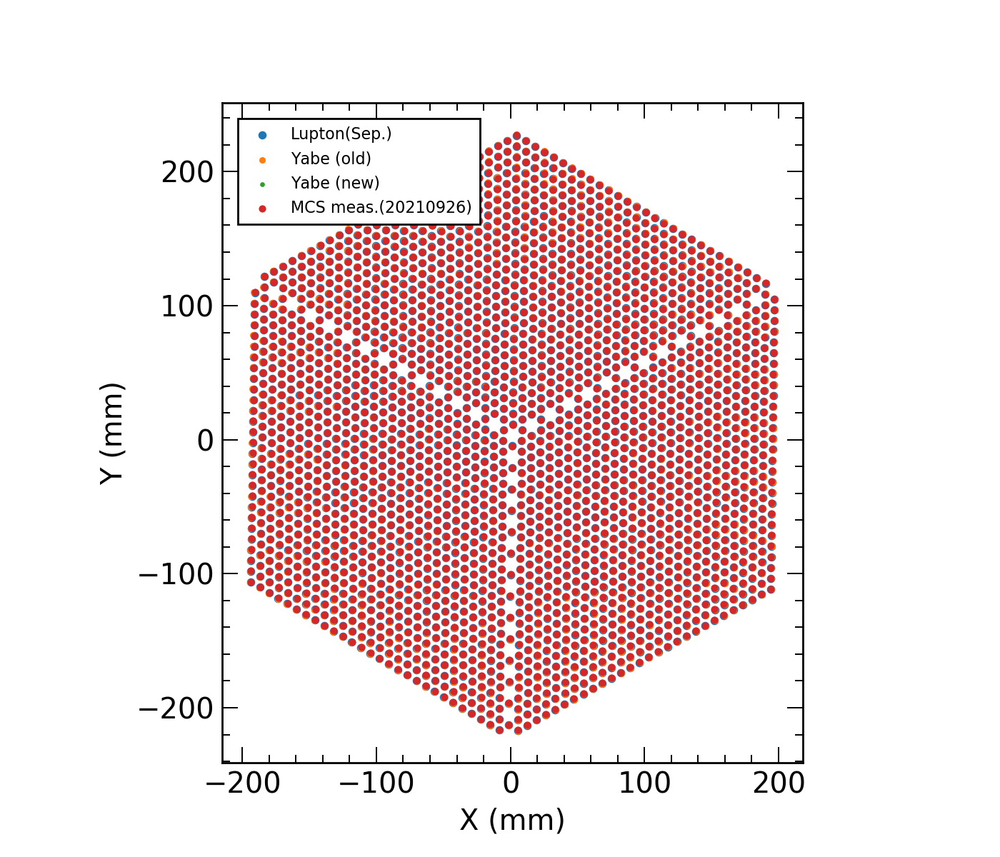

In [37]:
fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (mm)')
axe.set_ylabel(r'Y (mm)')
axe.set_title(r'')
axe.scatter(dot_x1, dot_y1, s=10, label='Lupton(Sep.)')
axe.scatter(dot_x2, dot_y2, s=5, label='Yabe (old)')
axe.scatter(dot_x3, dot_y3, s=2, label='Yabe (new)')
axe.scatter(dot_x4, dot_y4, s=7, label='MCS meas.(20210926)')
axe.legend(loc='upper left', fontsize=8)

In [38]:
## cross-match with Sep. data
dot_x1_matched = []
dot_y1_matched = []
for x1,y1 in zip(dot_x2, dot_y2):
    for x2, y2 in zip(dot_x1, dot_y1):
        d2 = (x1-x2)**2 + (y1-y2)**2
        if d2<=1.0**2:
            dot_x1_matched.append(x2)
            dot_y1_matched.append(y2)
dot_x1_matched=np.array(dot_x1_matched)
dot_y1_matched=np.array(dot_y1_matched)

<IPython.core.display.Javascript object>


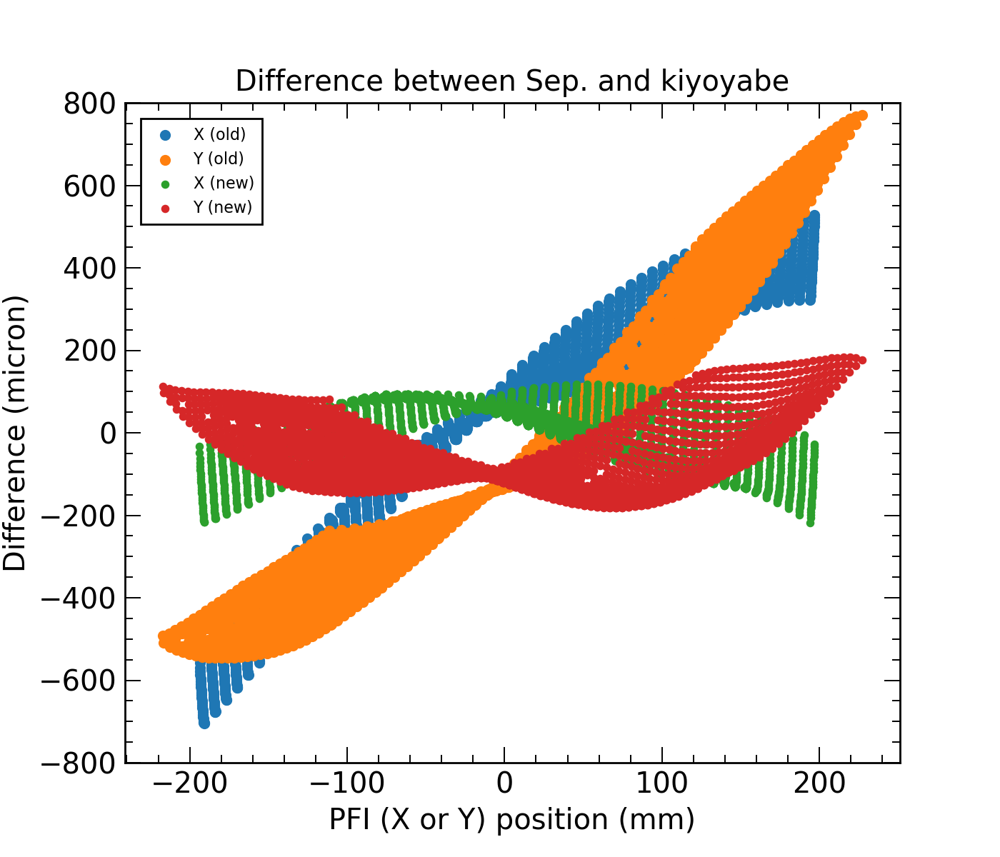

In [39]:
## check difference
fig, axe = plt.subplots(figsize=(7,6))
axe.set_xlabel(r'PFI (X or Y) position (mm)')
axe.set_ylabel(r'Difference (micron)')
axe.set_title(r'Difference between Sep. and kiyoyabe')
axe.set_ylim(-800, +800)
axe.scatter(dot_x1_matched, 1000*(dot_x2 - dot_x1_matched) , s=20, c='C0', label='X (old)')
axe.scatter(dot_y1_matched, 1000*(dot_y2 - dot_y1_matched) , s=20, c='C1', label='Y (old)')
axe.scatter(dot_x1_matched, 1000*(dot_x3 - dot_x1_matched) , s=10, c='C2', label='X (new)')
axe.scatter(dot_y1_matched, 1000*(dot_y3 - dot_y1_matched) , s=10, c='C3', label='Y (new)')
axe.legend(loc='upper left', fontsize=8)

### check dots and FFs on PFI plane

In [40]:
filename = os.path.join('black_dots_mm_kiyoyabe_20210926.csv')
df = pd.read_csv(filename)
dot_pfi_id = df['dotId']
dot_pfi_x = df['x']
dot_pfi_y = df['y']
dot_pfi_r = df['r']

<IPython.core.display.Javascript object>


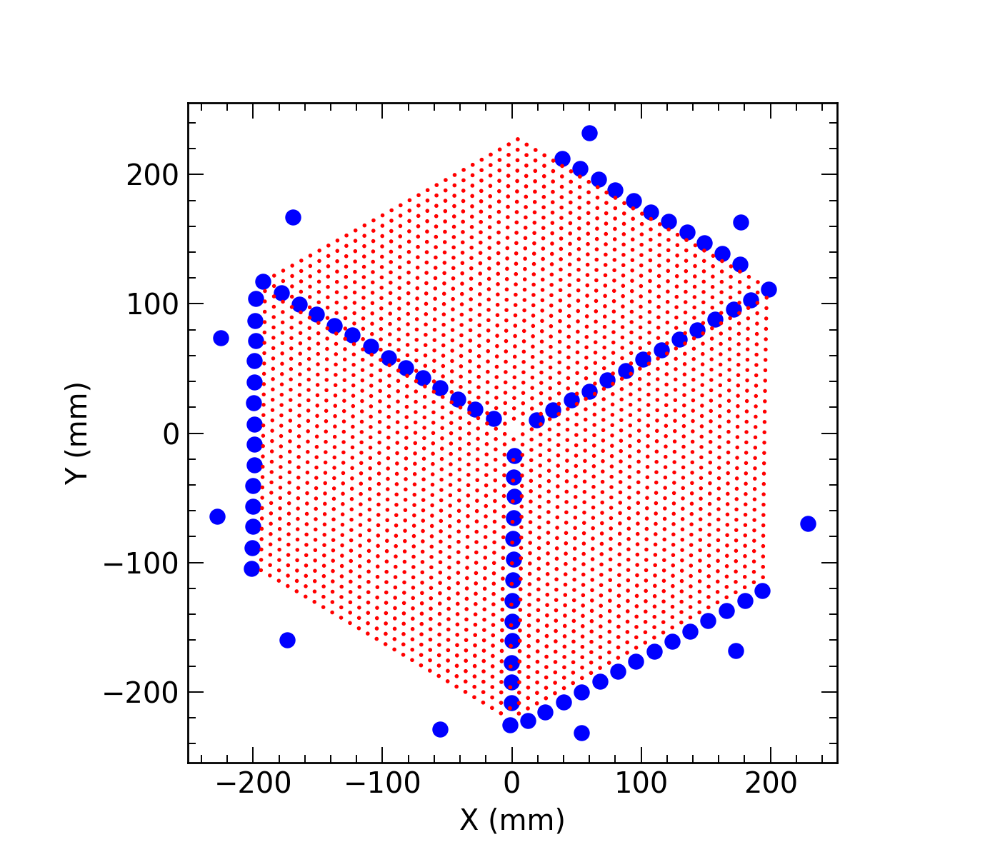

In [41]:
fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (mm)')
axe.set_ylabel(r'Y (mm)')
axe.set_title(r'')
axe.scatter(-1.0*ff_pfi_x, ff_pfi_y, s=50, c='blue')
for x,y,r in zip(dot_pfi_x, dot_pfi_y, dot_pfi_r):
    c1 = plt.Circle((x,y), r, color='red', fill=False)
    axe.add_artist(c1)    

## convert again from PFI mm to MCS pix using PfiTransform

In [42]:
filename = os.path.join('black_dots_mm_kiyoyabe_20210926.csv')
df = pd.read_csv(filename)
dot_pfi_id = df['dotId']
dot_pfi_x = df['x']
dot_pfi_y = df['y']
dot_pfi_r = df['r']

In [43]:
## FFs in mm
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=ff_pfi_y))  
## FFs in pix
mcs_data = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y)) 

In [44]:
mpt = PfiTransform()
mpt.updateTransform(mcs_data, fids, matchRadius=1.0, nMatchMin=0.75)

### current estimate

In [45]:
dot_mcs_trans_x, dot_mcs_trans_y = mpt.pfiToMcs(dot_pfi_x, dot_pfi_y)

In [46]:
x1, y1 = mpt.pfiToMcs(dot_pfi_x-dot_pfi_r, dot_pfi_y)
x2, y2 = mpt.pfiToMcs(dot_pfi_x+dot_pfi_r, dot_pfi_y)
dot_mcs_trans_r = (y1 - y2) / 2.0

### previous estimate

In [47]:
dot_mcs_old_trans_x, dot_mcs_old_trans_y = mpt.pfiToMcs(dot_pfi_old_x, dot_pfi_old_y)

In [48]:
x1, y1 = mpt.pfiToMcs(dot_pfi_old_x-dot_pfi_old_r, dot_pfi_old_y)
x2, y2 = mpt.pfiToMcs(dot_pfi_old_x+dot_pfi_old_r, dot_pfi_old_y)
dot_mcs_old_trans_r = (y1 - y2) / 2.0

### check image

<IPython.core.display.Javascript object>


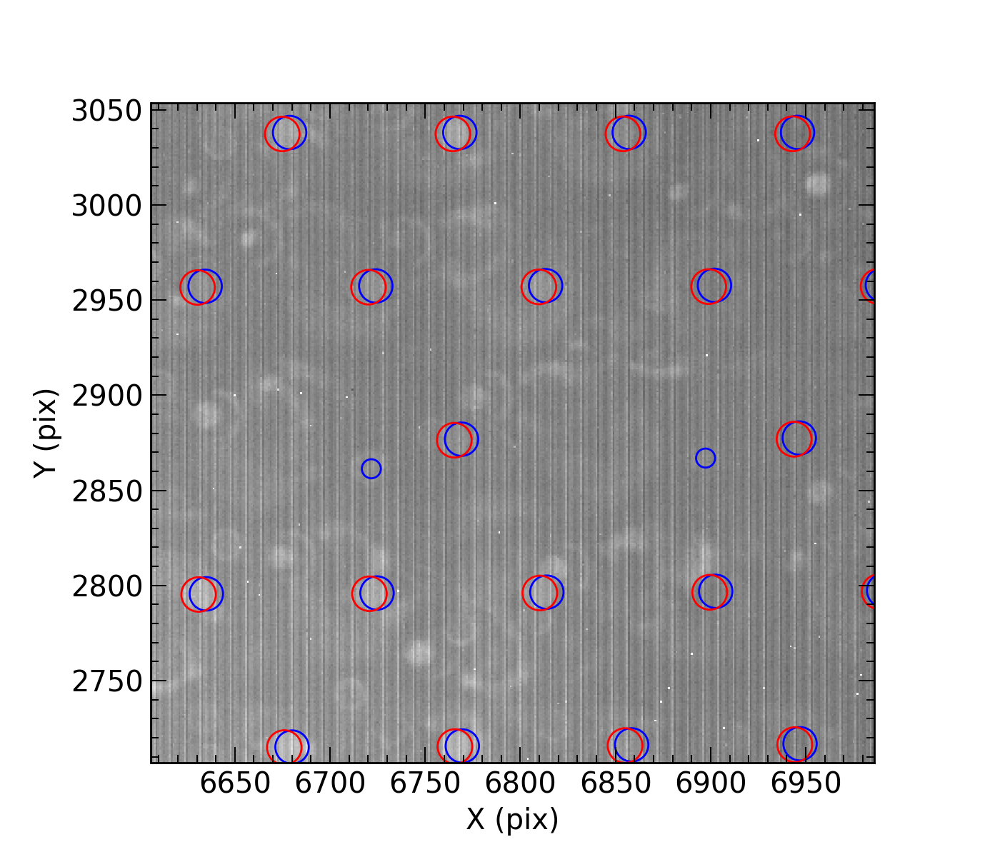

In [49]:
fig, axe = plt.subplots(figsize=(7, 6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_dots, origin='lower', cmap='gray', vmin=38000, vmax=40000)
for x,y,r in zip(dot_mcs_old_trans_x, dot_mcs_old_trans_y, dot_mcs_old_trans_r):
    c1 = plt.Circle((x,y), r, color='blue', fill=False)
    axe.add_artist(c1)
for x,y,r in zip(dot_mcs_trans_x, dot_mcs_trans_y, dot_mcs_trans_r):
    c1 = plt.Circle((x,y), r, color='red', fill=False)
    axe.add_artist(c1) 
for x,y in zip(ff_mcs_x, ff_mcs_y):
    c1 = plt.Circle((x,y), 5.0, color='blue', fill=False)
    axe.add_artist(c1)    

In [50]:
Nx = 3
Ny = 3
df = pd.DataFrame(
    dict(id=dot_mcs_id,
         x=dot_mcs_trans_x,
         y=dot_mcs_trans_y,
         r=dot_mcs_trans_r))
df_sampled = df.sample(n=Nx * Ny, random_state=6)
df_sampled.reset_index(drop=True)

,id,x,y,r
0,1064.0,3872.899207,3684.893413,8.790181
1,1885.0,5099.994201,3688.706393,8.792201
2,2344.0,6061.630326,4563.417548,8.509059
3,2180.0,5319.530186,4887.150530,8.240165
4,1705.0,3691.222774,4960.622124,8.188565
5,1666.0,4108.290010,4091.758956,8.653162
6,1841.0,4342.500341,4652.993964,8.367534
7,2101.0,6221.676004,3036.976196,8.988428
8,2291.0,5735.984127,4803.970622,8.329798


In [51]:
dot_mcs_old_cm_id = []
dot_mcs_old_trans_cm_x = []
dot_mcs_old_trans_cm_y = []
dot_mcs_old_trans_cm_r = []
for i, x1, y1 in zip(dot_mcs_id, dot_mcs_trans_x, dot_mcs_trans_y):
    for x2, y2, r2 in zip(dot_mcs_old_trans_x, dot_mcs_old_trans_y, dot_mcs_old_trans_r):
        if (x1 - x2)**2 + (y1 - y2)**2 < 10.0**2:
            dot_mcs_old_cm_id.append(i)
            dot_mcs_old_trans_cm_x.append(x2)
            dot_mcs_old_trans_cm_y.append(y2)
            dot_mcs_old_trans_cm_r.append(r2)
df_old = pd.DataFrame(
    dict(id=dot_mcs_old_cm_id,
         x=dot_mcs_old_trans_cm_x,
         y=dot_mcs_old_trans_cm_y,
         r=dot_mcs_old_trans_cm_r))
df_old_sampled = df_old.sample(n=Nx * Ny, random_state=6)
df_old_sampled.reset_index(drop=True)

,id,x,y,r
0,1064.0,3870.887044,3687.339091,8.814656
1,1885.0,5100.913484,3691.058765,8.818433
2,2344.0,6063.350832,4565.339799,8.510209
3,2180.0,5320.592896,4889.439829,8.415133
4,1705.0,3691.344315,4962.515942,8.372892
5,1666.0,4107.166752,4094.628733,8.727992
6,1841.0,4342.326772,4655.740874,8.538099
7,2101.0,6225.118029,3037.704989,8.818841
8,2291.0,5737.333817,4805.919018,8.430768


<IPython.core.display.Javascript object>


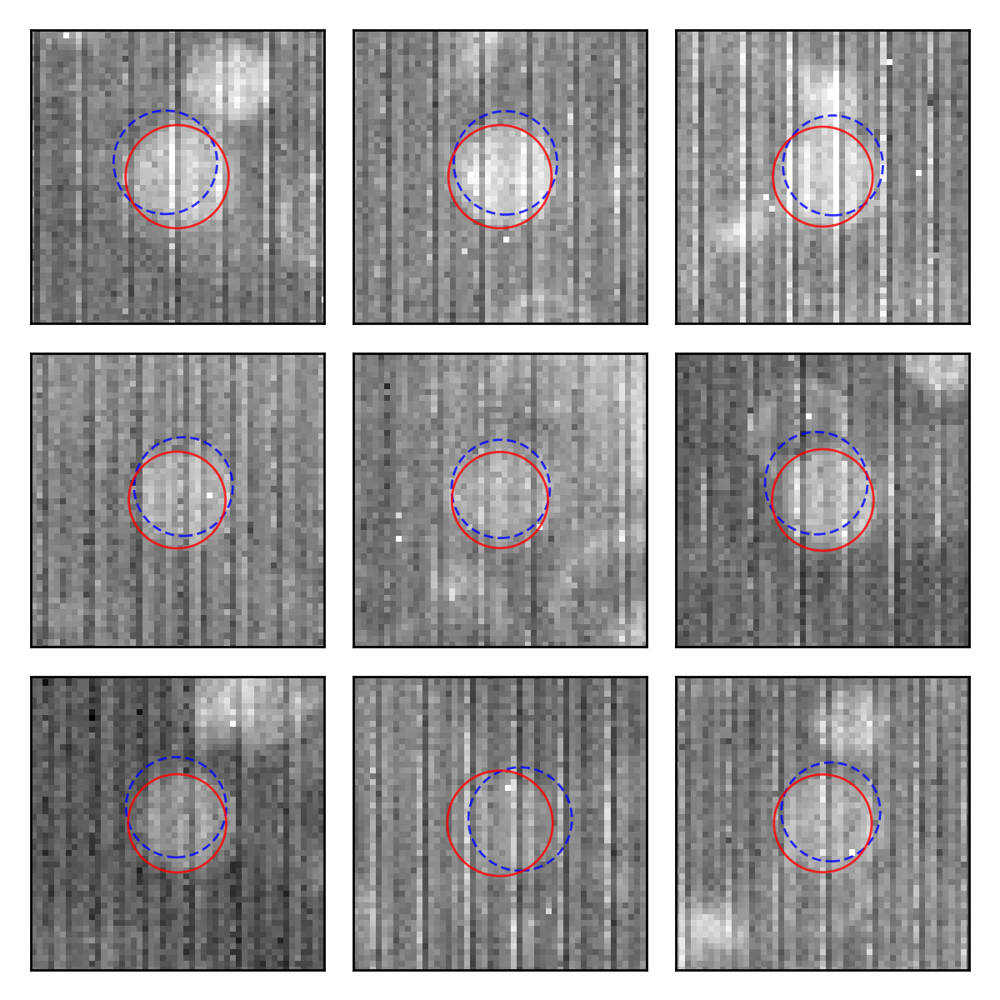

In [52]:
vmin = 38600
vmax = 39400

fig = plt.figure(figsize=(6, 6))
axes = [fig.add_subplot(Nx, Ny, n+1) for n in range(Nx*Ny)]

for i in range(len(df_sampled)):
    axe = axes[i]
    xc = df_sampled.iloc[i]['x']
    yc = df_sampled.iloc[i]['y']
    r = df_sampled.iloc[i]['r']
    xc_old = df_old_sampled.iloc[i]['x']
    yc_old = df_old_sampled.iloc[i]['y']
    r_old = df_old_sampled.iloc[i]['r']
    win = 25
    xmin = xc-win
    xmax = xc+win
    ymin = yc-win
    ymax = yc+win
    axe.set_xlim(xmin, xmax)
    axe.set_ylim(ymin, ymax)
    axe.imshow(data_dots, origin='lower', cmap='gray', vmin=vmin, vmax=vmax)
    c1 = plt.Circle((xc_old,yc_old), r_old, color='blue', ls='--', alpha=0.8, fill=False)
    axe.add_artist(c1) 
    c2 = plt.Circle((xc,yc), r, color='red', alpha=0.8, fill=False)
    axe.add_artist(c2) 
    axe.axes.xaxis.set_visible(False)
    axe.axes.yaxis.set_visible(False)
fig.tight_layout()
plt.savefig('dot_meas_example_20210926.pdf', bbox_inches='tight')
plt.savefig('dot_meas_example_20210926.png', bbox_inches='tight')

### difference from designed positions

In [53]:
offset_design_x = np.mean(dot_design_x)
offset_design_y = np.mean(dot_design_y)
print(offset_design_x, offset_design_y)

90.06664015384298 4.0


<IPython.core.display.Javascript object>


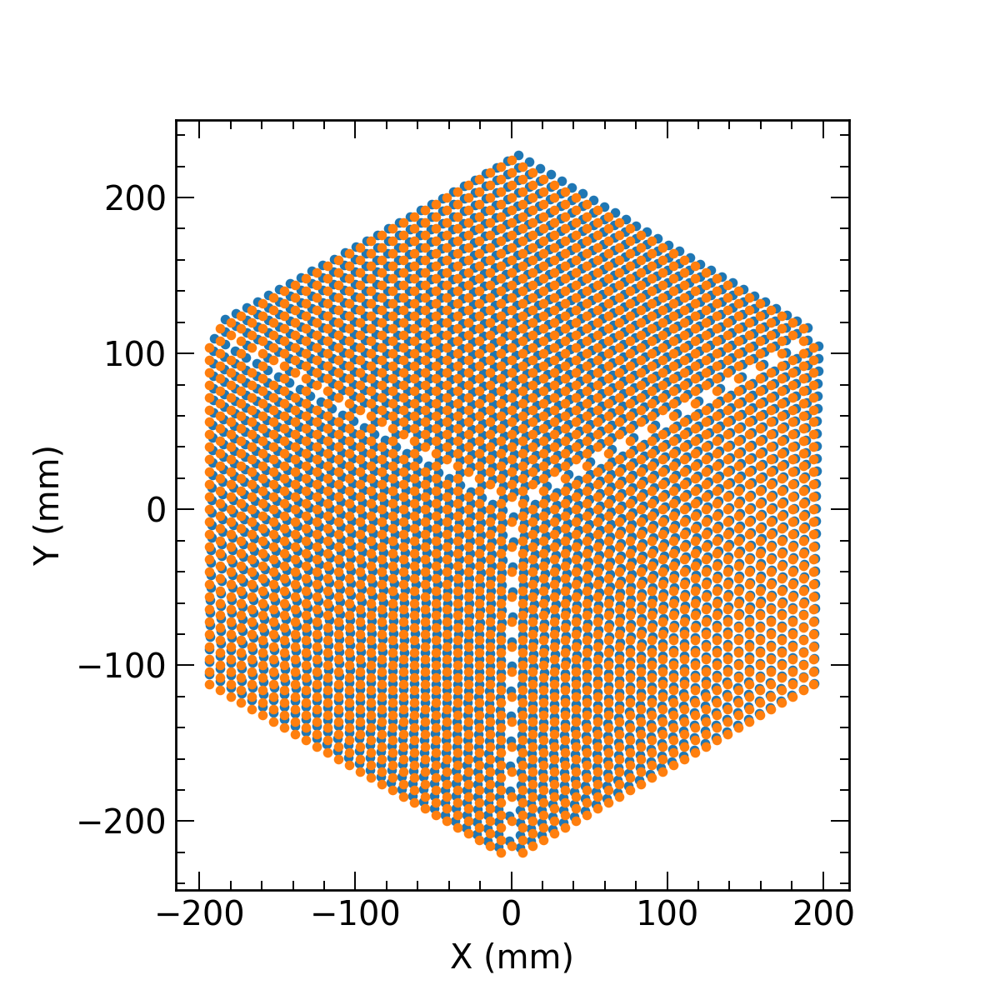

In [54]:
fig = plt.figure(figsize=(6,6))
axe = fig.add_subplot()
axe.set_aspect('equal')
axe.set_xlabel(r'X (mm)')
axe.set_ylabel(r'Y (mm)')
axe.scatter(dot_pfi_x, dot_pfi_y, s=10, c='C0', label='measured')
axe.scatter(dot_design_x-offset_design_x, dot_design_y-offset_design_y, s=10, c='C1', label='designed')

<IPython.core.display.Javascript object>


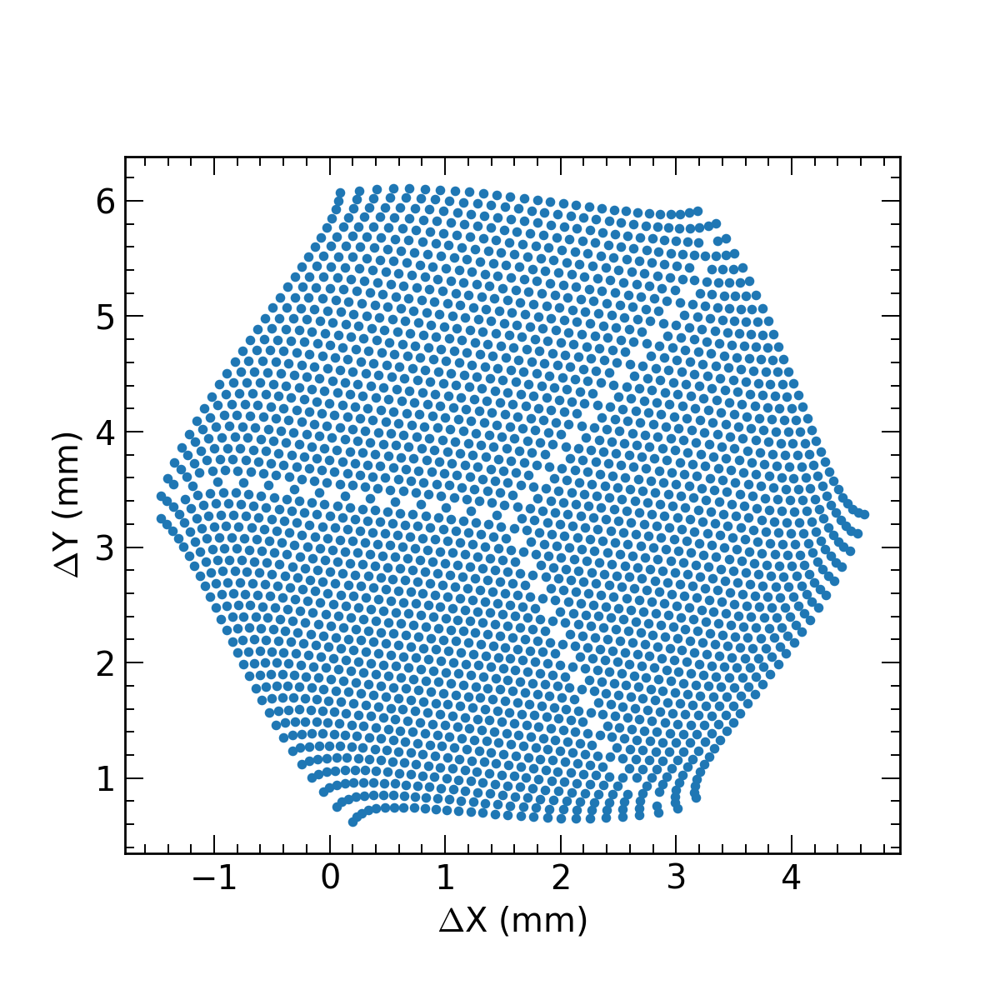

In [55]:
fig = plt.figure(figsize=(6,6))
axe = fig.add_subplot()
axe.set_aspect('equal')
axe.set_xlabel(r'$\Delta$X (mm)')
axe.set_ylabel(r'$\Delta$Y (mm)')
dx = (dot_pfi_x - (dot_design_x - offset_design_x))
dy = (dot_pfi_y - (dot_design_y - offset_design_y))
axe.scatter(dx, dy, s=10, c='C0')
plt.savefig('comparison_dot_measured-designed.pdf', bbox_inches='tight')
plt.savefig('comparison_dot_measured-designed.png', bbox_inches='tight')

# make measured ff position (in MCS pix) for all elevations

## rot angle = 0 deg., EL=90 deg.

91 90
93.0


<IPython.core.display.Javascript object>


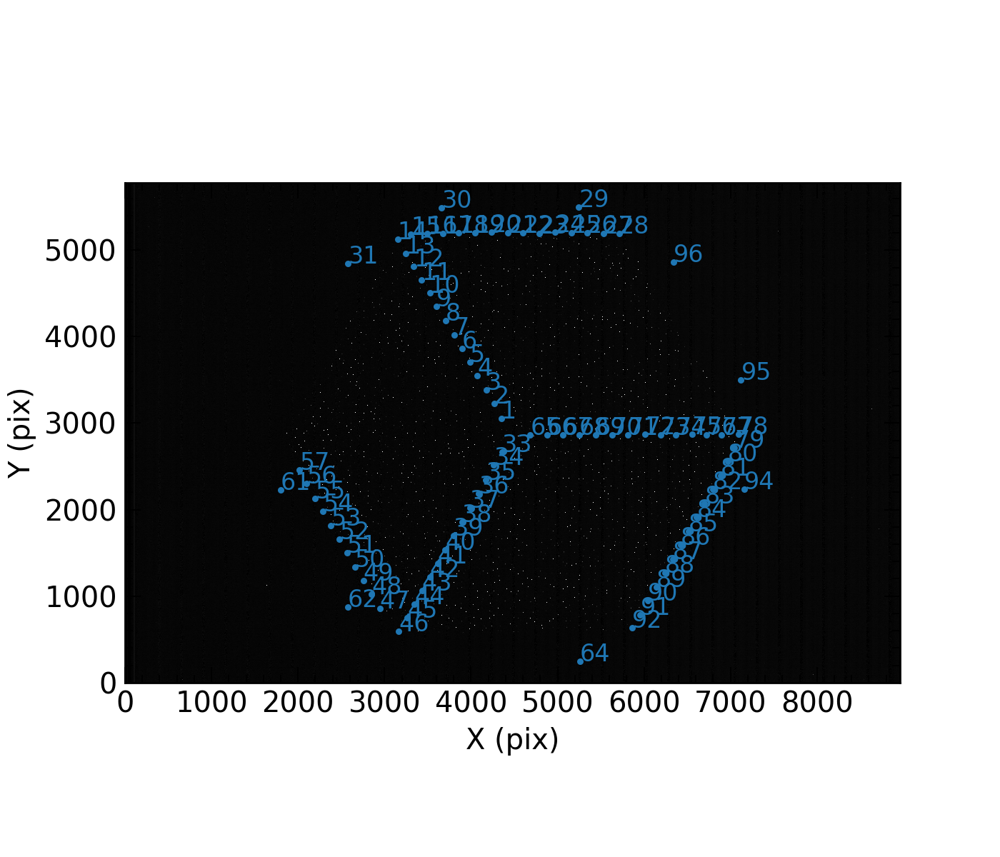

,id,x_pix,y_pix
0,1,4350.430176,3052.739990
1,2,4266.370117,3227.580078
2,3,4174.290039,3381.860107


In [56]:
el = 90
insrot = 0
visit = 68841

''' read data '''
filename=os.path.join(im_data_dir, 'PFSC%06d00.fits' % (visit))
with fits.open(filename) as hdul:
    data_ffs=hdul[1].data

filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v%d.csv' % (visit)
mcs_data = pd.read_csv(filename)
spots_x = mcs_data['mcs_center_x_pix'].copy()
spots_y = mcs_data['mcs_center_y_pix'].copy()
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=1.0*ff_pfi_y))

''' first guess '''
mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=False)
mpt.updateTransform(mcs_data, fids, matchRadius=15, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 70 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)  

''' second guess '''
mcs_data2 = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))

mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=True)
mpt.updateTransform(mcs_data2, fids, matchRadius=1, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 20 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)
ff_mcs_id = np.array(ff_mcs_id, dtype='i4')            
ff_mcs_x = np.array(ff_mcs_x, dtype='f4')
ff_mcs_y = np.array(ff_mcs_y, dtype='f4')

''' sanity check '''
print(len(ff_mcs_init_id),len(ff_mcs_id))

for i1 in ff_mcs_init_id:
    c=0
    for i2 in ff_mcs_id:
         if i1==i2:
                c+=1
    if c==0:
        print(i1)

fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_x, ff_mcs_y, s=5, c='C0')
for i in range(len(ff_mcs_id)):
    axe.text(ff_mcs_x[i], ff_mcs_y[i], ff_mcs_id[i], c='C0', fontsize=12)    

''' writeto '''
df = pd.DataFrame({
    'id': np.array(ff_mcs_id, dtype='i4'),
    'x_pix': np.array(ff_mcs_x, dtype='f4'),
    'y_pix': np.array(ff_mcs_y, dtype='f4'),
})
df.to_csv('ffs_mcs_pix_kiyoyabe_20211108_v%d.csv' % (visit), index=False)
df[:3]


## rot angle = 0 deg., EL=75 deg.

91 90
93.0


<IPython.core.display.Javascript object>


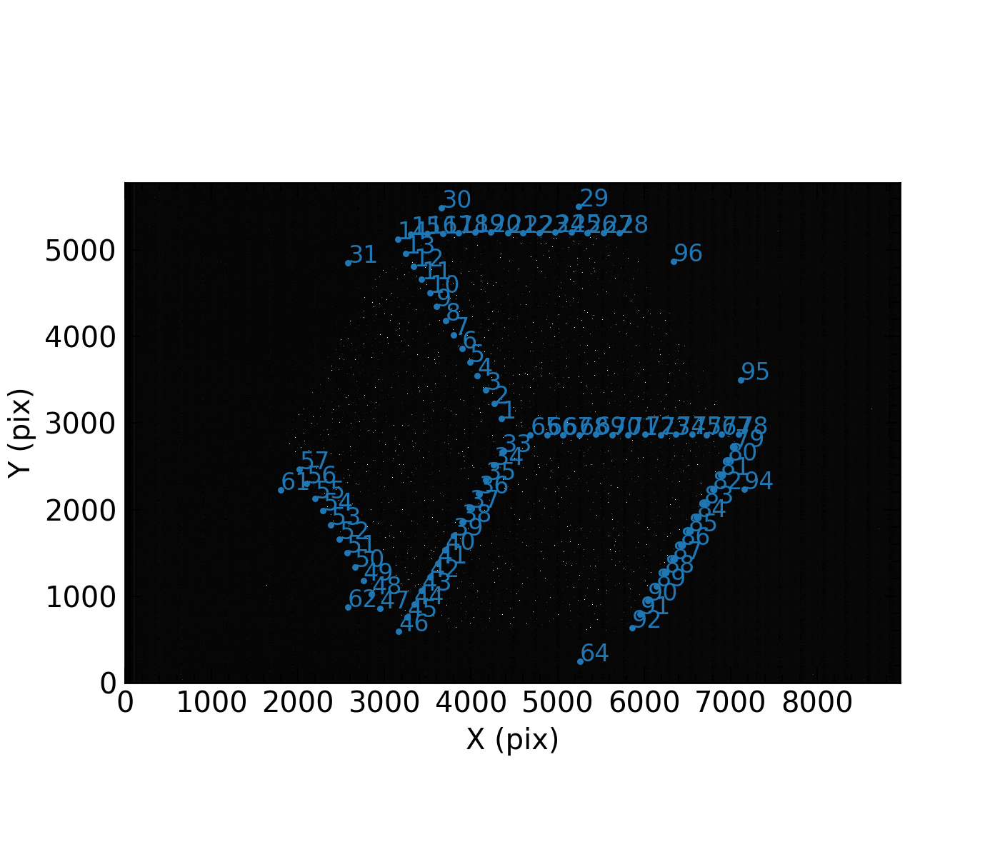

,id,x_pix,y_pix
0,1,4349.970215,3054.860107
1,2,4265.939941,3229.719971
2,3,4173.819824,3383.989990


In [57]:
el = 75
insrot = 0
visit = 68838

''' read data '''
filename=os.path.join(im_data_dir, 'PFSC%06d00.fits' % (visit))
with fits.open(filename) as hdul:
    data_ffs=hdul[1].data

filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v%d.csv' % (visit)
mcs_data = pd.read_csv(filename)
spots_x = mcs_data['mcs_center_x_pix'].copy()
spots_y = mcs_data['mcs_center_y_pix'].copy()
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=1.0*ff_pfi_y))

''' first guess '''
mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=False)
mpt.updateTransform(mcs_data, fids, matchRadius=15, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 70 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)  

''' second guess '''
mcs_data2 = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))

mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=True)
mpt.updateTransform(mcs_data2, fids, matchRadius=1, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 20 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)
ff_mcs_id = np.array(ff_mcs_id, dtype='i4')            
ff_mcs_x = np.array(ff_mcs_x, dtype='f4')
ff_mcs_y = np.array(ff_mcs_y, dtype='f4')

''' sanity check '''
print(len(ff_mcs_init_id),len(ff_mcs_id))

for i1 in ff_mcs_init_id:
    c=0
    for i2 in ff_mcs_id:
         if i1==i2:
                c+=1
    if c==0:
        print(i1)

fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_x, ff_mcs_y, s=5, c='C0')
for i in range(len(ff_mcs_id)):
    axe.text(ff_mcs_x[i], ff_mcs_y[i], ff_mcs_id[i], c='C0', fontsize=12)    

''' writeto '''
df = pd.DataFrame({
    'id': np.array(ff_mcs_id, dtype='i4'),
    'x_pix': np.array(ff_mcs_x, dtype='f4'),
    'y_pix': np.array(ff_mcs_y, dtype='f4'),
})
df.to_csv('ffs_mcs_pix_kiyoyabe_20211108_v%d.csv' % (visit), index=False)
df[:3]


## rot angle = 0 deg., EL=60 deg.

91 90
93.0


<IPython.core.display.Javascript object>


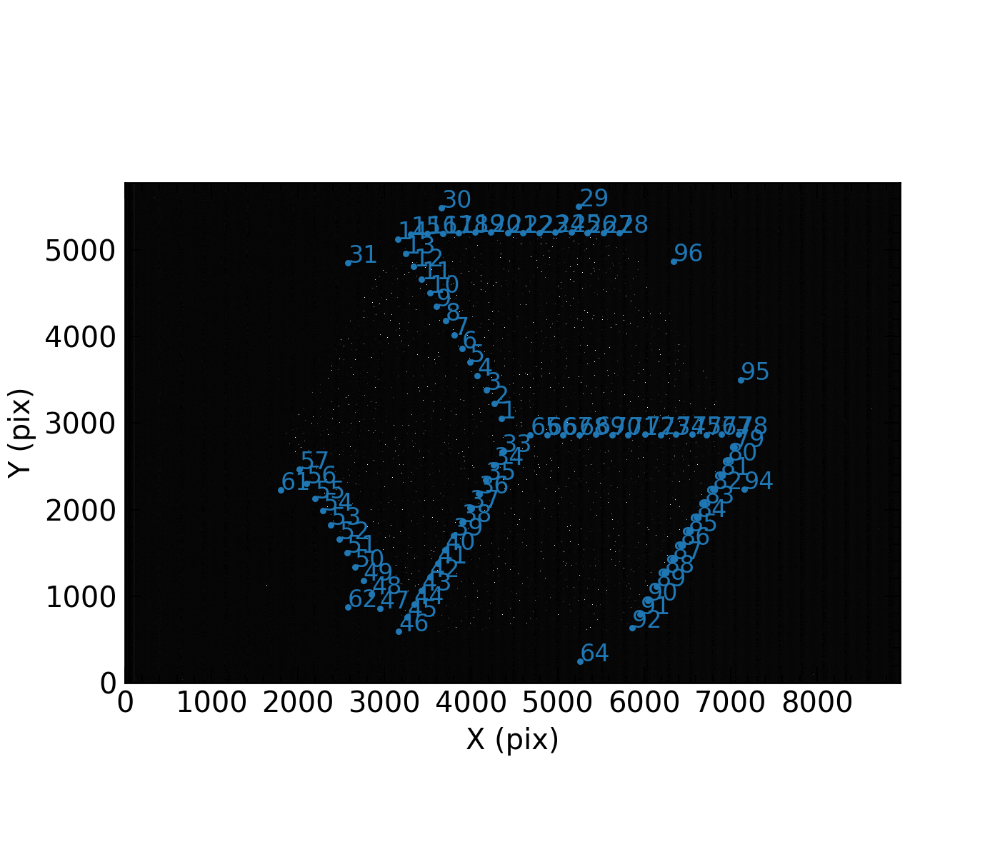

,id,x_pix,y_pix
0,1,4350.140137,3054.949951
1,2,4266.080078,3229.800049
2,3,4173.959961,3384.040039


In [58]:
el = 60
insrot = 0
visit = 68837

''' read data '''
filename=os.path.join(im_data_dir, 'PFSC%06d00.fits' % (visit))
with fits.open(filename) as hdul:
    data_ffs=hdul[1].data

filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v%d.csv' % (visit)
mcs_data = pd.read_csv(filename)
spots_x = mcs_data['mcs_center_x_pix'].copy()
spots_y = mcs_data['mcs_center_y_pix'].copy()
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=1.0*ff_pfi_y))

''' first guess '''
mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=False)
mpt.updateTransform(mcs_data, fids, matchRadius=15, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 70 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)  

''' second guess '''
mcs_data2 = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))

mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=True)
mpt.updateTransform(mcs_data2, fids, matchRadius=1, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 20 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)
ff_mcs_id = np.array(ff_mcs_id, dtype='i4')            
ff_mcs_x = np.array(ff_mcs_x, dtype='f4')
ff_mcs_y = np.array(ff_mcs_y, dtype='f4')

''' sanity check '''
print(len(ff_mcs_init_id),len(ff_mcs_id))

for i1 in ff_mcs_init_id:
    c=0
    for i2 in ff_mcs_id:
         if i1==i2:
                c+=1
    if c==0:
        print(i1)

fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_x, ff_mcs_y, s=5, c='C0')
for i in range(len(ff_mcs_id)):
    axe.text(ff_mcs_x[i], ff_mcs_y[i], ff_mcs_id[i], c='C0', fontsize=12)    

''' writeto '''
df = pd.DataFrame({
    'id': np.array(ff_mcs_id, dtype='i4'),
    'x_pix': np.array(ff_mcs_x, dtype='f4'),
    'y_pix': np.array(ff_mcs_y, dtype='f4'),
})
df.to_csv('ffs_mcs_pix_kiyoyabe_20211108_v%d.csv' % (visit), index=False)
df[:3]


## rot angle = 0 deg., EL=45 deg.

91 90
93.0


<IPython.core.display.Javascript object>


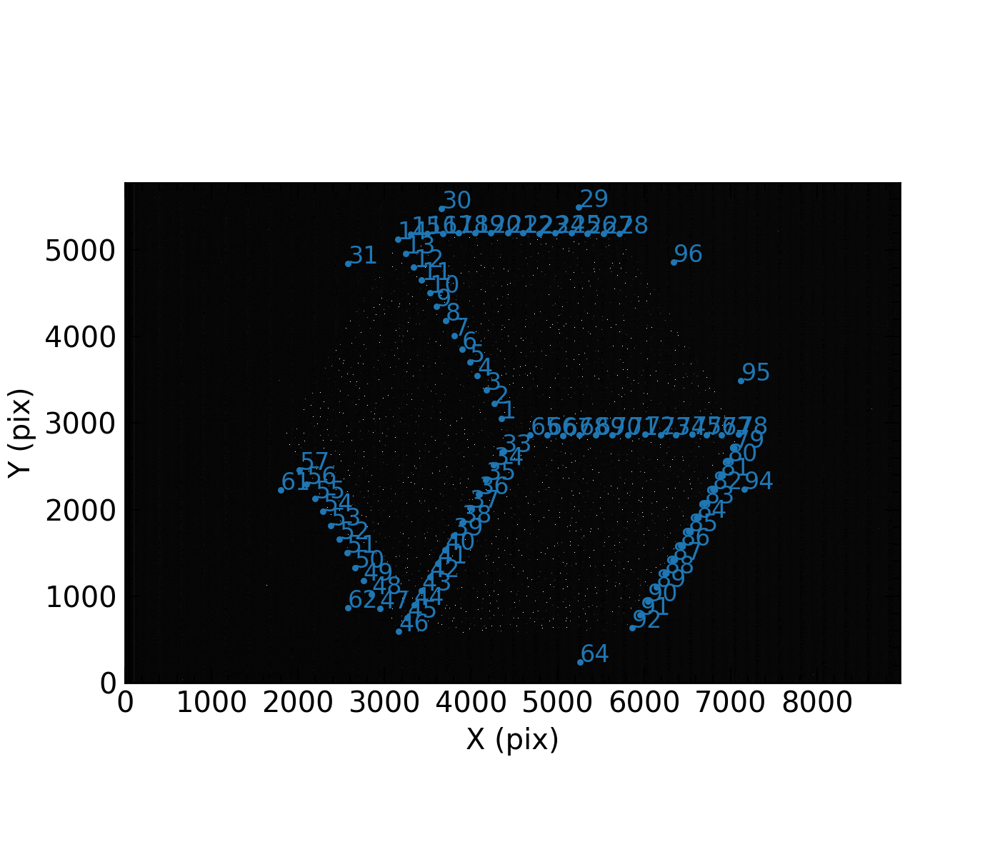

,id,x_pix,y_pix
0,1,4350.200195,3051.080078
1,2,4266.149902,3225.909912
2,3,4174.020020,3380.179932


In [59]:
el = 45
insrot = 0
visit = 68833

''' read data '''
filename=os.path.join(im_data_dir, 'PFSC%06d00.fits' % (visit))
with fits.open(filename) as hdul:
    data_ffs=hdul[1].data

filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v%d.csv' % (visit)
mcs_data = pd.read_csv(filename)
spots_x = mcs_data['mcs_center_x_pix'].copy()
spots_y = mcs_data['mcs_center_y_pix'].copy()
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=1.0*ff_pfi_y))

''' first guess '''
mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=False)
mpt.updateTransform(mcs_data, fids, matchRadius=15, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 70 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)  

''' second guess '''
mcs_data2 = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))

mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=True)
mpt.updateTransform(mcs_data2, fids, matchRadius=1, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 20 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)
ff_mcs_id = np.array(ff_mcs_id, dtype='i4')            
ff_mcs_x = np.array(ff_mcs_x, dtype='f4')
ff_mcs_y = np.array(ff_mcs_y, dtype='f4')

''' sanity check '''
print(len(ff_mcs_init_id),len(ff_mcs_id))

for i1 in ff_mcs_init_id:
    c=0
    for i2 in ff_mcs_id:
         if i1==i2:
                c+=1
    if c==0:
        print(i1)

fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_x, ff_mcs_y, s=5, c='C0')
for i in range(len(ff_mcs_id)):
    axe.text(ff_mcs_x[i], ff_mcs_y[i], ff_mcs_id[i], c='C0', fontsize=12)    

''' writeto '''
df = pd.DataFrame({
    'id': np.array(ff_mcs_id, dtype='i4'),
    'x_pix': np.array(ff_mcs_x, dtype='f4'),
    'y_pix': np.array(ff_mcs_y, dtype='f4'),
})
df.to_csv('ffs_mcs_pix_kiyoyabe_20211108_v%d.csv' % (visit), index=False)
df[:3]


## rot angle = 0 deg., EL=30 deg.

91 90
93.0


<IPython.core.display.Javascript object>


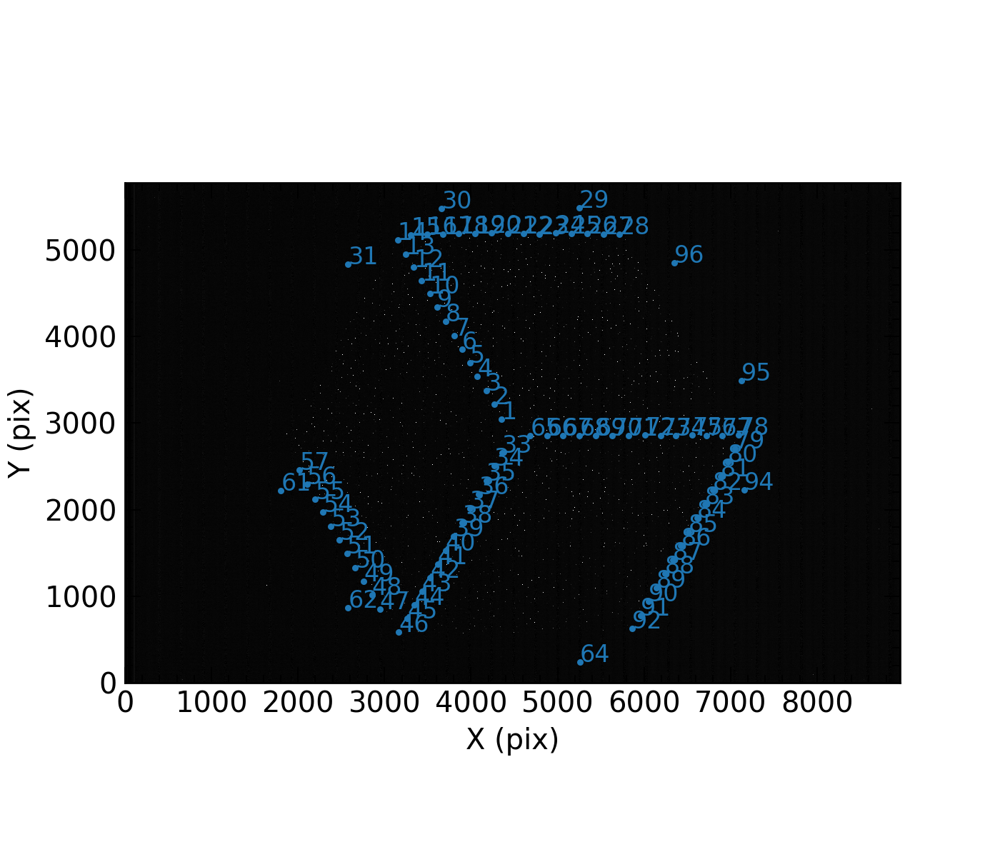

,id,x_pix,y_pix
0,1,4352.290039,3044.649902
1,2,4268.140137,3219.489990
2,3,4176.120117,3373.739990


In [60]:
el = 30
insrot = 0
visit = 68834

''' read data '''
filename=os.path.join(im_data_dir, 'PFSC%06d00.fits' % (visit))
with fits.open(filename) as hdul:
    data_ffs=hdul[1].data

filename = '/work/PFS/pfi/data/ait_subaru_202107/dot_measurements/mcs_data_v%d.csv' % (visit)
mcs_data = pd.read_csv(filename)
spots_x = mcs_data['mcs_center_x_pix'].copy()
spots_y = mcs_data['mcs_center_y_pix'].copy()
fids = pd.DataFrame(dict(fiducialId=ff_pfi_id, x_mm=-1.0*ff_pfi_x, y_mm=1.0*ff_pfi_y))

''' first guess '''
mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=False)
mpt.updateTransform(mcs_data, fids, matchRadius=15, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 70 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)  

''' second guess '''
mcs_data2 = pd.DataFrame(dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))

mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=True)
mpt.updateTransform(mcs_data2, fids, matchRadius=1, nMatchMin=0.75)
ff_mcs_init_x, ff_mcs_init_y = mpt.pfiToMcs(fids.x_mm, fids.y_mm)
ff_mcs_init_id = fids.fiducialId.values.copy()

sep = 20 # matching radius in MCS pix
nFF = len(ff_mcs_init_id)
ff_mcs_id = []
ff_mcs_x = []
ff_mcs_y = []
for i,x,y in zip(ff_mcs_init_id, ff_mcs_init_x, ff_mcs_init_y):
    for sx, sy in zip(spots_x, spots_y):
        d2 = (x - sx)**2 + (y - sy)**2
        if d2 <= sep**2:
            ff_mcs_id.append(i)
            ff_mcs_x.append(sx)
            ff_mcs_y.append(sy)
ff_mcs_id = np.array(ff_mcs_id, dtype='i4')            
ff_mcs_x = np.array(ff_mcs_x, dtype='f4')
ff_mcs_y = np.array(ff_mcs_y, dtype='f4')

''' sanity check '''
print(len(ff_mcs_init_id),len(ff_mcs_id))

for i1 in ff_mcs_init_id:
    c=0
    for i2 in ff_mcs_id:
         if i1==i2:
                c+=1
    if c==0:
        print(i1)

fig, axe = plt.subplots(figsize=(7,6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (pix)')
axe.set_ylabel(r'Y (pix)')
axe.set_title(r'')
axe.imshow(data_ffs, origin='lower', cmap='gray', vmin=500, vmax=1000)
axe.scatter(ff_mcs_x, ff_mcs_y, s=5, c='C0')
for i in range(len(ff_mcs_id)):
    axe.text(ff_mcs_x[i], ff_mcs_y[i], ff_mcs_id[i], c='C0', fontsize=12)    

''' writeto '''
df = pd.DataFrame({
    'id': np.array(ff_mcs_id, dtype='i4'),
    'x_pix': np.array(ff_mcs_x, dtype='f4'),
    'y_pix': np.array(ff_mcs_y, dtype='f4'),
})
df.to_csv('ffs_mcs_pix_kiyoyabe_20211108_v%d.csv' % (visit), index=False)
df[:3]


# get measured dot position in PFI mm coordinates (all cases)

In [61]:
def getDotPosPfi(visit, el, insrot):
    ''' get measured dot position in MCS pix '''
    filename = './results/dot_measurements_subaru_20210926_el%02d_rot+%02d_v%d.csv' % (
        el, insrot, visit)
    df = pd.read_csv(filename)
    dot_mcs_id = df['id']
    dot_mcs_x = df['x_tran']
    dot_mcs_y = df['y_tran']
    dot_mcs_r = df['r_tran']
    ''' get ff position in PFI mm '''
    if el>80:
        filename = os.path.join(ff_data_dir, 'fiber_status_summary_FF_0C90DEG.txt')
    elif el > 50:
        filename = os.path.join(ff_data_dir, 'fiber_status_summary_FF_0C60DEG.txt')
    else:
        filename = os.path.join(ff_data_dir, 'fiber_status_summary_FF_0C30DEG.txt')
    ff_pfi_id, ff_pfi_x, ff_pfi_y = np.genfromtxt(filename,
                                                  unpack=True,
                                                  usecols=(1, 3, 4))
    msk = (ff_pfi_id != 32) * (ff_pfi_id != 63) * (ff_pfi_id != 93)
    ff_pfi_id = ff_pfi_id[msk]
    ff_pfi_x = ff_pfi_x[msk]
    ff_pfi_y = ff_pfi_y[msk]
    ''' get ff position in MCS pix '''
    if el > 80:
        filename = 'ffs_mcs_pix_kiyoyabe_20211108_v68841.csv'
    elif el > 70:
        filename = 'ffs_mcs_pix_kiyoyabe_20211108_v68838.csv'
    elif el > 50:
        filename = 'ffs_mcs_pix_kiyoyabe_20211108_v68837.csv'
    elif el > 40:
        filename = 'ffs_mcs_pix_kiyoyabe_20211108_v68833.csv'
    else:
        filename = 'ffs_mcs_pix_kiyoyabe_20211108_v68834.csv'
    df = pd.read_csv(filename)
    ff_mcs_id = df['id']
    ff_mcs_x = df['x_pix']
    ff_mcs_y = df['y_pix']
    ''' get conversion from MCS pix to PFI mm '''
    fids = pd.DataFrame(
        dict(fiducialId=ff_pfi_id, x_mm=-1.0 * ff_pfi_x, y_mm=ff_pfi_y))
    mcs_data = pd.DataFrame(
        dict(mcs_center_x_pix=ff_mcs_x, mcs_center_y_pix=ff_mcs_y))
    mpt = PfiTransform(altitude=el, insrot=insrot, applyDistortion=True)
    mpt.updateTransform(mcs_data, fids, matchRadius=1.0, nMatchMin=0.75)
    ''' calculate dot position in PFI mm '''
    dot_pfi_x, dot_pfi_y = mpt.mcsToPfi(dot_mcs_x, dot_mcs_y)
    ''' calculate dot radius in PFI mm '''
    x1, y1 = mpt.mcsToPfi(dot_mcs_x - dot_mcs_r, dot_mcs_y)
    x2, y2 = mpt.mcsToPfi(dot_mcs_x + dot_mcs_r, dot_mcs_y)
    dot_pfi_r = (y1 - y2) / 2.0
    ''' writeto file '''
    df = pd.DataFrame({
        'dotId': np.array(dot_mcs_id, dtype='i4'),
        'x': np.array(dot_pfi_x, dtype='f4'),
        'y': np.array(dot_pfi_y, dtype='f4'),
        'r': np.array(dot_pfi_r, dtype='f4')
    })
    df.to_csv('black_dots_mm_el%02d_rot+%02d_kiyoyabe_20210926.csv' % (el, insrot), index=False)

## rot angle = 0 deg., EL=90 deg.

In [62]:
getDotPosPfi(visit=68840, el=90, insrot=0)

## rot angle = 0 deg., EL=75 deg.

In [63]:
getDotPosPfi(visit=68839, el=75, insrot=0)

## rot angle = 0 deg., EL=60 deg.

In [64]:
getDotPosPfi(visit=68836, el=60, insrot=0)

## rot angle = 0 deg., EL=45 deg.

In [65]:
getDotPosPfi(visit=68832, el=45, insrot=0)

## rot angle = 0 deg., EL=30 deg.

In [66]:
getDotPosPfi(visit=68835, el=30, insrot=0)

## sanity check

In [67]:
df1 = pd.read_csv('black_dots_mm_el90_rot+00_kiyoyabe_20210926.csv')
df2 = pd.read_csv('black_dots_mm_el75_rot+00_kiyoyabe_20210926.csv')
df3 = pd.read_csv('black_dots_mm_el60_rot+00_kiyoyabe_20210926.csv')
df4 = pd.read_csv('black_dots_mm_el45_rot+00_kiyoyabe_20210926.csv')
df5 = pd.read_csv('black_dots_mm_el30_rot+00_kiyoyabe_20210926.csv')

<IPython.core.display.Javascript object>


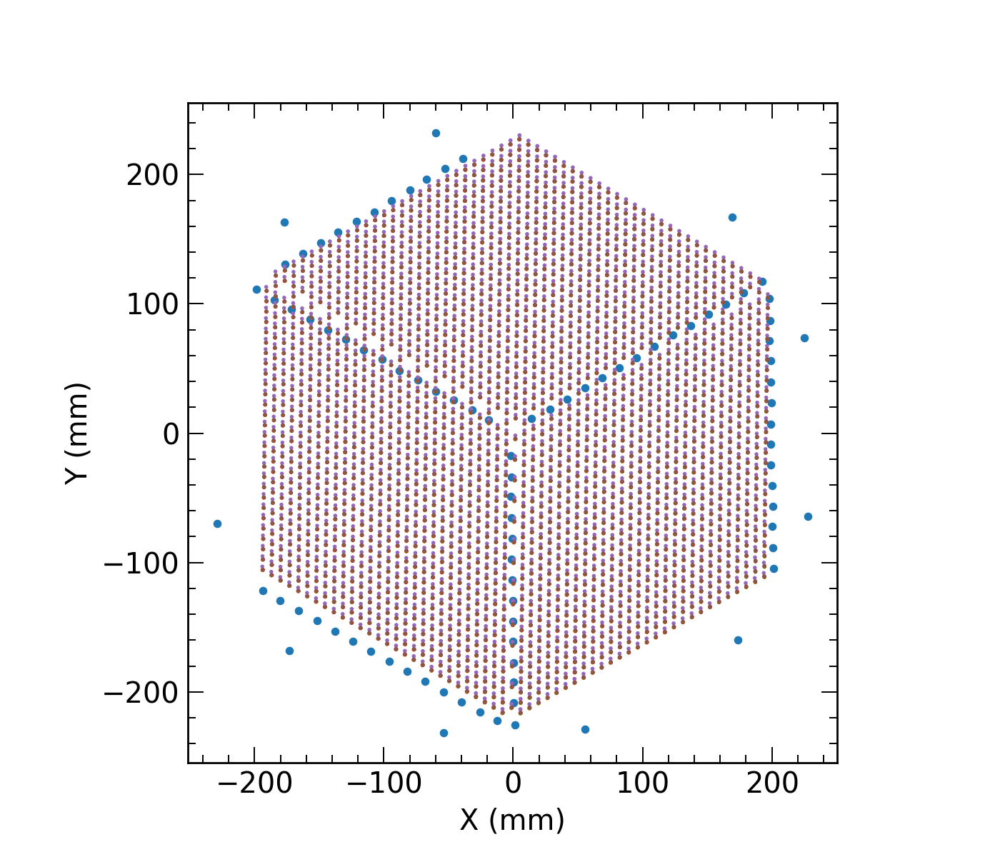

In [68]:
fig, axe = plt.subplots(figsize=(7, 6))
axe.set_aspect('equal')
axe.set_xlabel(r'X (mm)')
axe.set_ylabel(r'Y (mm)')
axe.set_title(r'')
axe.scatter(ff_pfi_x, ff_pfi_y, s=10, c='C0')
for x,y,r in zip(df1['x'], df1['y'], df1['r']):
    c1 = plt.Circle((x,y), r, color='C1', fill=False)
    axe.add_artist(c1) 
for x,y,r in zip(df2['x'], df2['y'], df2['r']):
    c1 = plt.Circle((x,y), r, color='C2', fill=False)
    axe.add_artist(c1) 
for x,y,r in zip(df3['x'], df3['y'], df3['r']):
    c1 = plt.Circle((x,y), r, color='C3', fill=False)
    axe.add_artist(c1) 
for x,y,r in zip(df4['x'], df4['y'], df4['r']):
    c1 = plt.Circle((x,y), r, color='C4', fill=False)
    axe.add_artist(c1) 
for x,y,r in zip(df5['x'], df5['y'], df5['r']):
    c1 = plt.Circle((x,y), r, color='C5', fill=False)
    axe.add_artist(c1) 
    

# sort out file products

In [69]:
products_dir = './products'

## fiducial fibers in PFI mm

In [70]:
comment1 = '''# Positions of fiducials measured using x-y scanner at ASIAA
# From Richard Chou <cychou@asiaa.sinica.edu.tw>, sent to Chi-Hung Yan 2021-05-24
# 
# N.b. x_mm is swapped from the ASRD data to match the definitions on the summit
# 
# Columns:
#   fiducialId    ID for fiducial
#   x_mm, y_mm    Position of object, in mm
# 
'''

temps = [0, 20]
els = [90, 60, 30]

for temp in temps:
    for el in els:
        filename = os.path.join(
            ff_data_dir,
            'fiber_status_summary_FF_%dC%02dDEG.txt' % (temp, el))
        ff_pfi_id, ff_pfi_x, ff_pfi_y = np.genfromtxt(filename,
                                                      unpack=True,
                                                      usecols=(1, 3, 4))
        df = pd.DataFrame({
            'fiducialId': np.array(ff_pfi_id, dtype='i4'),
            'x_mm': np.array(-1.0*ff_pfi_x, dtype='f4'),
            'y_mm': np.array(ff_pfi_y, dtype='f4')
        })
        filename = os.path.join(products_dir, 'ff', 'ff_pfi_mm_t%02d_el%02d_rot+00.csv' % (temp, el))
        with open(filename, 'w') as f:
            f.write(comment1)
            f.write('# Notes:\n')
            f.write('#   temperature = %02d C\n' % (temp))
            f.write('#   elevation   = %02d deg.\n' % (el))
            f.write('#\n')
        df.to_csv(filename, index=False, mode='a')

## black dots in PFI mm

## black dots in MCS pix